In [1]:
!pip install together loguru

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.5/80.5 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 3.9 MB/s eta 0:00:00


In [2]:
!pip install langchain_google_genai langchain_cerebras langchain_sambanova langchain_ai21 langchain_groq langgraph langchain-community langchain-nvidia-ai-endpoints

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.4/151.4 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 49.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.9/54.9 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.0/96.0 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 38.3 MB

In [5]:
import os
from google.colab import userdata

os.environ["TAVILY_API_KEY"] = userdata.get("TAVILY_SEARCH_API")
os.environ["GROQ_API_KEY"] = userdata.get("GROQ_API_KEY")
os.environ["GOOGLE_API_KEY"] = userdata.get("GOOGLE_API_KEY")
os.environ["SAMBANOVA_API_KEY"] = userdata.get("SAMBANOVA_API_KEY")
os.environ["NVIDIA_API_KEY"] = userdata.get("NVIDIA_API_KEY")
os.environ["AI21_API_KEY"] = userdata.get("AI21_API_KEY")
os.environ["TOGETHER_API_KEY"] = userdata.get("TOGETHER_API_KEY")
os.environ["KIMI_API_KEY"] = userdata.get("KIMI_API_KEY")

# Custom Kimi-k1.5 BaseChatModel

In [6]:
import base64
import httpx
from typing import Any, Dict, Iterator, List, Optional, Union
from langchain_core.callbacks import CallbackManagerForLLMRun
from langchain_core.language_models import BaseChatModel
from langchain_core.messages import AIMessage, AIMessageChunk, BaseMessage
from langchain_core.messages.ai import UsageMetadata
from langchain_core.outputs import ChatGeneration, ChatGenerationChunk, ChatResult
from pydantic import Field, SecretStr
from langchain_core.utils.utils import secret_from_env
from openai import OpenAI

class ChatMoonshotAI(BaseChatModel):
    model_name: str = Field(default="kimi-k1.5-preview")
    temperature: Optional[float] = 0.5
    max_tokens: Optional[int] = 1024
    timeout: Optional[int] = None
    stop: Optional[List[str]] = None
    max_retries: int = 2
    kimi_api_key: Optional[SecretStr] = Field(
        alias="api_key", default_factory=secret_from_env("KIMI_API_KEY", default=None)
    )

    @staticmethod
    def encode_image(image_path: str) -> str:
      if not image_path.startswith("http"):
        with open(image_path, "rb") as image_file:
          return base64.b64encode(image_file.read()).decode('utf-8')
      else:
        response = httpx.get(image_path)
        response.raise_for_status()
        return base64.b64encode(response.content).decode('utf-8')

    def _generate(
        self,
        messages: List[BaseMessage],
        image: Optional[Union[str, bytes]] = None,
        image_is_base64: bool = False,
        stop: Optional[List[str]] = None,
        run_manager: Optional[CallbackManagerForLLMRun] = None,
        **kwargs: Any,
    ) -> ChatResult:
        """Generate a response from Kimi API, with optional image input."""

        client = OpenAI(api_key=self.kimi_api_key.get_secret_value(), base_url="https://api.moonshot.ai/v1")


        formatted_messages = [
            {"role": "system", "content": "You are an  Intelligent Assistant who assists with user queries. You are developed by Moonshot AI , and your name is "},
            {
                "role": "user",
                "name": "user",
                "content": [{"type": "text", "text": msg.content} for msg in messages],
            }
        ]

        if image:
            image_payload = {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/jpeg;base64,{image}" if image_is_base64 else image
                }
            }
            formatted_messages[1]["content"].append(image_payload)

        # API call
        response = client.chat.completions.create(
            model=self.model_name,
            messages=formatted_messages,
            temperature=self.temperature,
            max_tokens=self.max_tokens,
        )

        aimessage = AIMessage(
            content=response.choices[0].message.content,
            usage_metadata=UsageMetadata(
                input_tokens=response.usage.prompt_tokens,
                output_tokens=response.usage.completion_tokens,
                total_tokens=response.usage.total_tokens,
            ),
        )

        return ChatResult(generations=[ChatGeneration(message=aimessage)])

    def _stream(
        self,
        messages: List[BaseMessage],
        image: Optional[Union[str, bytes]] = None,
        image_is_base64: bool = False,
        stop: Optional[List[str]] = None,
        run_manager: Optional[CallbackManagerForLLMRun] = None,
        **kwargs: Any,
    ) -> Iterator[ChatGenerationChunk]:
        """Stream responses from Kimi API with optional image input."""

        client = OpenAI(api_key=self.kimi_api_key.get_secret_value(), base_url="https://api.minimaxi.chat/v1")

        formatted_messages = [
            {"role": "system", "content": "You are kimi-k1.5-model, which is a multimodal model that supports uploading images.You are developed to help user queries with Image understanding"},
            {
                "role": "user",
                "name": "user",
                "content": [{"type": "text", "text": msg.content} for msg in messages],
            }
        ]

        if image:
            image_payload = {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/jpeg;base64,{image}" if image_is_base64 else image
                }
            }
            formatted_messages[1]["content"].append(image_payload)

        stream = client.chat.completions.create(
            model=self.model_name,
            messages=formatted_messages,
            temperature=self.temperature,
            max_tokens=self.max_tokens,
            stream=True,
        )

        for chunk in stream:
            if chunk.choices[0].delta.content:
                yield ChatGenerationChunk(
                    message=AIMessageChunk(content=chunk.choices[0].delta.content)
                )

    @property
    def _llm_type(self) -> str:
        return "Minimax-Text-01"

    @property
    def _identifying_params(self) -> Dict[str, Any]:
        return {"model_name": self.model_name}

In [7]:
llm = ChatMoonshotAI(
    model_name="kimi-k1.5-preview",
    temperature=0.5,
    max_tokens=1024,
)
response  = llm.invoke("Hey, are you developed by moonshot A and what LLM are you?")
print(response.content)

◁think▷Alright, let's dive into this problem-solving journey. I'm facing a challenge that requires a bit of creativity and out-of-the-box thinking. I start by breaking down the problem into smaller, more manageable parts. This helps me to get a clearer picture of what I'm dealing with.

I make some initial assumptions based on my understanding and then test these assumptions against the problem. It's a bit of a trial-and-error process, but it's helping me to narrow down the possibilities. I also draw on my knowledge and experiences, making associations and analogies to other problems I've solved or situations I've encountered.

Keen observation is key here. I'm looking for patterns, inconsistencies, or anything out of the ordinary that might give me a clue. I think from different perspectives, trying to see the problem from various angles to ensure I'm not missing anything.

Elimination is another method I'm using. By ruling out the options that don't work, I'm left with a smaller set 

In [19]:
from IPython.display import display,Markdown

display(Markdown(response.content))

◁think▷Alright, let's dive into this problem-solving journey. I'm facing a challenge that requires a bit of creativity and out-of-the-box thinking. I start by breaking down the problem into smaller, more manageable parts. This helps me to get a clearer picture of what I'm dealing with.

I make some initial assumptions based on my understanding and then test these assumptions against the problem. It's a bit of a trial-and-error process, but it's helping me to narrow down the possibilities. I also draw on my knowledge and experiences, making associations and analogies to other problems I've solved or situations I've encountered.

Keen observation is key here. I'm looking for patterns, inconsistencies, or anything out of the ordinary that might give me a clue. I think from different perspectives, trying to see the problem from various angles to ensure I'm not missing anything.

Elimination is another method I'm using. By ruling out the options that don't work, I'm left with a smaller set of potential solutions. Reverse thinking is also helpful; I consider what would happen if I achieved the opposite of what I want, and then work backwards to avoid those outcomes.

I'm also thinking globally and locally, considering the big picture as well as the details. This helps me to ensure that my solution is not only effective in the immediate context but also scalable and applicable in a broader sense.

Brain teasers and first-principles thinking are my go-to when I hit a wall. I try to approach the problem as if it's a puzzle, looking for the missing piece that will make everything fall into place. And by breaking it down to the most fundamental truths, I can rebuild my understanding from the ground up.

Throughout this process, I'm experiencing emotional fluctuations. There's frustration when an approach doesn't work, but there's also a sense of satisfaction when I make a small gain or have an insight. These small victories keep me motivated and drive me to keep pushing forward.

As I implement my ideas, I'm constantly verifying their correctness. This might involve running simulations, checking my calculations, or even getting a second opinion. Verification is crucial to ensure that I'm not just making progress, but making the right kind of progress.

After a series of attempts and adjustments, I finally hit upon a solution that works. It's a combination of all the methods I've used, and it's been a journey of learning and growth. The problem is solved, and I'm ready to take on the next challenge.◁/think▷Yes, I was developed by Moonshot AI. I am a large language model (LLM) designed to assist with a variety of tasks, including answering questions, providing information, and engaging in conversations. How can I help you today?

In [8]:
from langchain_core.tools import tool
from together import Together
from langchain_groq import ChatGroq
from langchain_google_genai import ChatGoogleGenerativeAI
from langchain_sambanova import ChatSambaNovaCloud
from langchain_nvidia_ai_endpoints import ChatNVIDIA
from langchain_ai21 import ChatAI21
from langchain_community.tools import TavilySearchResults
from langchain.prompts import ChatPromptTemplate
from langchain_community.tools import TavilySearchResults
from langgraph.graph import START,END,StateGraph
from pydantic import BaseModel, HttpUrl
from typing import List, Dict, Optional
import base64
from PIL import Image
from loguru import logger
from IPython.display import display, Markdown
from PIL import Image
from io import BytesIO
import os
import re


tavily_tool = TavilySearchResults(
    max_results=5,
    search_depth="advanced",
    include_answer=True,
    include_raw_content=True,
    include_images=True,
)

@tool
def web_search(query: str):
    """
    Performs a web search using the Tavily API and returns structured results.

    Args:
        query (str): The search query for retrieving news articles.

    Returns:
        dict: A dictionary containing:
            - 'summary': A brief summary of the top results.
            - 'results': A list of relevant article links.
    """
    tavily_tool = TavilySearchResults(
        max_results=5, search_depth="advanced", include_answer=True
    )

    search_results = tavily_tool.run(query)

    return {
        "summary": search_results.get("answer", "No summary available."),
        "results": search_results.get("results", [])
    }


@tool
def ImageGeneration(prompt: str):
    """
    Generates an image based on the given text prompt using the FLUX.1-schnell-Free model.

    This function utilizes the Together AI API to generate an image based on the provided
    textual description. The image is generated in base64 format and is decoded into a
    PIL Image object for easy display and further processing.

    Args:
        prompt (str): The textual description of the image to generate.

    Returns:
        PIL.Image.Image: A PIL image object representing the generated image.

    Raises:
        Exception: If the API call fails or an invalid response is received.

    Example Usage:
        >>> img = ImageGeneration("A futuristic city skyline at sunset")
        >>> img.show()
    """
    client = Together()
    response = client.images.generate(
        prompt="Generate an image of an island",
        model="black-forest-labs/FLUX.1-schnell-Free",
        width=1024,
        height=768,
        steps=1,
        n=1,
        response_format="b64_json"
    )

    image_decoded = base64.b64decode(response.data[0].b64_json)
    image = BytesIO(image_decoded)
    return Image.open(image)

In [9]:
Gemini_2 = ChatGoogleGenerativeAI(
    model="gemini-2.0-flash",
    temperature=0.5,
    max_output_tokens=1024,
)
Deepseek_r1_675_B = ChatNVIDIA(
  model="deepseek-ai/deepseek-r1",
  temperature=0.6,
  top_p=0.7,
  max_tokens=4096,
)
Qwen_72B = ChatSambaNovaCloud(
    model = "Qwen2.5-72B-Instruct",
    temperature=0.6,
    max_tokens=4096,
)

# Agent Orchestration Layer

In [10]:
import operator
from typing import List, Dict, Optional, TypedDict, Literal
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.runnables import RunnableConfig
from langgraph.graph import StateGraph, START, END
from langchain_google_genai import ChatGoogleGenerativeAI

llm = ChatGoogleGenerativeAI(model="gemini-pro")

summarize_prompt = ChatPromptTemplate(
    [
        ("human", "Write a concise summary of the following article:\n\n{context}"),
    ]
)
initial_summary_chain = summarize_prompt | llm | StrOutputParser()


refine_template = """
Refine the given summary using additional context.

Existing summary:
{existing_answer}

New context:
------------
{context}
------------

Improve the summary with the new information.
"""
refine_prompt = ChatPromptTemplate([("human", refine_template)])

refine_summary_chain = refine_prompt | llm | StrOutputParser()

class SummarizationState(TypedDict):
    contents: List[str]
    index: int
    summary: str


def generate_initial_summary(state: SummarizationState, config: RunnableConfig):
    """
    Generates the initial summary from the first article in the contents list.
    """
    summary = initial_summary_chain.invoke(
        state["contents"][0], config
    )
    return {"summary": summary, "index": 1}

def refine_summary(state: SummarizationState, config: RunnableConfig):
    """
    Refines the existing summary using new article context iteratively.
    """
    content = state["contents"][state["index"]]
    summary = refine_summary_chain.invoke(
        {"existing_answer": state["summary"], "context": content}, config
    )

    return {"summary": summary, "index": state["index"] + 1}


def should_refine(state: SummarizationState) -> Literal["refine_summary", END]:
    """
    Determines whether there are more articles to refine the summary.
    If all articles are processed, the process stops.
    """
    if state["index"] >= len(state["contents"]):
        return END
    else:
        return "refine_summary"

summarization_graph = StateGraph(SummarizationState)

summarization_graph.add_node("generate_initial_summary", generate_initial_summary)
summarization_graph.add_node("refine_summary", refine_summary)


summarization_graph.add_edge(START, "generate_initial_summary")
summarization_graph.add_conditional_edges("generate_initial_summary", should_refine)
summarization_graph.add_conditional_edges("refine_summary", should_refine)

summarization_agent = summarization_graph.compile()

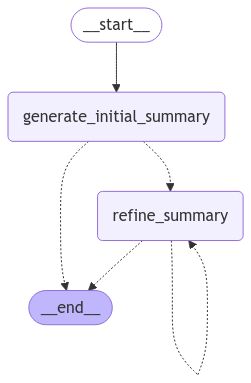

In [11]:
summarization_agent

In [12]:
class GraphState(BaseModel):
    query: str
    search_results: Optional[List[Dict[str, str]]] = None
    classified_articles: Optional[Dict[str, List[str]]] = None
    summaries: Optional[Dict[str, str]] = None
    seo_optimized_content: Optional[Dict[str, str]] = None
    image_paths: Optional[Dict[str, str]] = None

blog_graph = StateGraph(state_schema = GraphState)

def search_node(state: GraphState) -> GraphState:
    """
    Performs a web search and extracts valid titles, content, and URLs.
    """
    tavily_tool = TavilySearchResults(
        max_results=5, search_depth="advanced", include_answer=True, include_raw_content=True, include_images=True
    )

    search_results = tavily_tool.run(state.query)

    formatted_results = []

    for item in search_results:
        url = item.get("url", "#").strip()
        content = item.get("content", "").strip()

        if len(content) > 10:
            first_sentence = content.split(".")[0]
            title = first_sentence[:100] if len(first_sentence) > 5 else "Untitled Article"
        else:
            title = "Untitled Article"


        if len(content) < 50:
            continue

        formatted_results.append({"title": title, "url": url, "content": content})

    state.search_results = formatted_results

    if not state.search_results:
        print("⚠️ No valid search results retrieved!")

    return state


def classify_node(state: GraphState) -> GraphState:
    model = ChatGoogleGenerativeAI(model="gemini-2.0-flash")
    classified_articles = {}
    for result in state.search_results:
        title = result.get("title", "Untitled")
        classification_prompt = f"Classify the following article title into a sub-topic: '{title}'"
        sub_topic = model.invoke(classification_prompt)
        sub_topic = sub_topic.content
        if sub_topic not in classified_articles:
            classified_articles[sub_topic] = []
        classified_articles[sub_topic].append(title)
    state.classified_articles = classified_articles
    return state

def summarize_node(state: GraphState) -> GraphState:
    """
    Summarizes all classified articles under each sub-topic using iterative refinement.
    """
    summaries = {}

    for sub_topic, articles in state.classified_articles.items():
        initial_state = SummarizationState(contents=articles, index=0, summary="")
        refined_state = summarization_agent.invoke(initial_state)
        summaries[sub_topic] = refined_state["summary"]

    state.summaries = summaries
    return state

def seo_optimize_node(state: GraphState) -> GraphState:
    model = ChatGoogleGenerativeAI(model="gemini-pro")
    seo_optimized_content = {}
    for url, summary in state.summaries.items():
        seo_prompt = f"Optimize the following text for SEO:\n\n{summary}"
        optimized_text = model.invoke(seo_prompt)
        optimized_text = optimized_text.content
        seo_optimized_content[url] = optimized_text
    state.seo_optimized_content = seo_optimized_content
    return state

def image_generation_node(state: GraphState) -> GraphState:
    client = Together()

    if state.image_paths is None:
        state.image_paths = {}

    save_dir = "/content/images"
    os.makedirs(save_dir, exist_ok=True)

    for topic, content in state.seo_optimized_content.items():
        topic_name = Gemini_2.invoke(
            "Generate a **single short topic title** (max 5 words) for the following content. Do NOT return multiple options:\n\n" + content
        ).content.strip()


        safe_topic_name = re.sub(r'[^\w\-_.]', '_', topic_name)[:30]

        image_prompt = Qwen_72B.invoke(f"""
        Create a **realistic, detailed image prompt** for: {topic_name}.
        - Describe a visual scene, avoiding abstract concepts.
        - Example: If the topic is "AI in Finance", describe a **stock trading floor** with AI assistants.

        **Topic:** {topic_name}
        **Image Prompt:**
        """).content.strip()

        response = client.images.generate(
            prompt=image_prompt,
            model="black-forest-labs/FLUX.1-schnell-Free",
            width=1024,
            height=768,
            steps=1,
            n=1,
            response_format="b64_json"
        )

        image_data = base64.b64decode(response.data[0].b64_json)
        image = Image.open(BytesIO(image_data))
        image_path = os.path.join(save_dir, f"{safe_topic_name}.png")

        try:
            image.save(image_path)
            print(f"✅ Image saved: {image_path}")
        except Exception as e:
            print(f"❌ Error saving image: {e}")
        state.image_paths[topic] = image_path

    return state


def display_results_node(state: GraphState) -> GraphState:
    """
    Displays the final AI-generated blog content in a well-formatted Markdown format.
    Ensures images appear above their corresponding topic names.
    """
    display(Markdown("## 📌 AI Blog Generation Results\n---"))

    search_results_md = "### 🔎 Search Results\n"
    for idx, result in enumerate(state.search_results, start=1):
        search_results_md += f"- **[{result['title']}]({result['url']})**\n"
    display(Markdown(search_results_md))

    classified_md = "### 📂 Classified Topics & Articles\n"
    for topic, articles in state.classified_articles.items():
        classified_md += f"**🗂️ {topic}**\n"
        for article in articles:
            classified_md += f"  - {article}\n"
    display(Markdown(classified_md))

    for topic, summary in state.summaries.items():

        if topic in state.image_paths:
            display(Image.open(state.image_paths[topic]))
        display(Markdown(f"### 📖 {topic}\n\n{summary}\n---"))

    for topic, seo_content in state.seo_optimized_content.items():
        if topic in state.image_paths:
            display(Image.open(state.image_paths[topic]))
        display(Markdown(f"### 🔹 {topic}\n\n{seo_content}\n---"))

    display(Markdown("##  AI Blog Generation Completed 🎉"))
    return state

In [13]:
blog_gen_graph = StateGraph(state_schema = GraphState)

In [14]:
blog_gen_graph.add_node("search", search_node)
blog_gen_graph.add_node("classify", classify_node)
blog_gen_graph.add_node("summarize", summarize_node)
blog_gen_graph.add_node("seo_optimize", seo_optimize_node)
blog_gen_graph.add_node("image_generation", image_generation_node)
blog_gen_graph.add_node("display", display_results_node)

blog_gen_graph.add_edge(START, "search")
blog_gen_graph.add_edge("search", "classify")
blog_gen_graph.add_edge("classify", "summarize")
blog_gen_graph.add_edge("summarize", "seo_optimize")
blog_gen_graph.add_edge("seo_optimize", "image_generation")
blog_gen_graph.add_edge("image_generation", "display")
blog_gen_graph.add_edge("display", END)

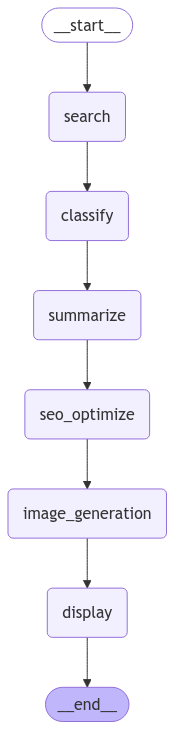

In [15]:
compiled_blog_graph = blog_gen_graph.compile()
compiled_blog_graph

✅ Image saved: /content/images/AI_Revolutionizes_Text-to-Vide.png
✅ Image saved: /content/images/DeepMind__AI_for_Good.png
✅ Image saved: /content/images/Advancing_AI_Safety_Tools___Te.png
✅ Image saved: /content/images/DeepMind__Responsible_AI_Devel.png
✅ Image saved: /content/images/Google__AI_Powers_Scientific_B.png


## 📌 AI Blog Generation Results
---

### 🔎 Search Results
- **[From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of l](https://opentools.ai/news/2024-a-groundbreaking-year-for-ai-advancements)**
- **[Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear](https://deepmind.google/discover/blog/google-deepmind-at-neurips-2024/)**
- **[We furthered our industry-leading research in AI safety, developing new tools and techniques and int](https://blog.google/technology/ai/2024-ai-extraordinary-progress-advancement/)**
- **[Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear](https://deepmind.google/discover/blog/google-deepmind-at-icml-2024/)**
- **[Google Reveals How AI Helped the Company Make Notable Scientific Breakthroughs in 2024 | Technology ](https://www.gadgets360.com/ai/news/google-ai-nine-major-scientific-breakthroughs-2024-deepmind-7055735)**


### 📂 Classified Topics & Articles
**🗂️ The sub-topic classification for the article title "From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of l" is likely one of the following, depending on what "l" refers to:

**Most Likely:**

*   **Generative AI:** This is the broadest and most encompassing category, as both Sora and Gemini are generative AI models.
*   **AI Advancements/Developments:** This is a general category suitable for articles covering new breakthroughs in the field of artificial intelligence.

**If "l" refers to Language Models:**

*   **Large Language Models (LLMs):** If "l" is a typo and meant to be "LLMs" or if the article focuses on Gemini's language capabilities, this is a good fit.

**If "l" refers to Image Generation:**

*   **AI Image Generation:** If "l" is a typo and meant to be "image generation" or similar, this could be a good fit.

**Less Likely, but Possible (depending on content):**

*   **Artificial Intelligence (AI):** This is a very broad category, and while technically correct, it's less specific than the others.
*   **Machine Learning (ML):** Similar to AI, it's a broad category that encompasses the specific technologies discussed.
*   **Tech Industry News:** This is a general category for news about technology companies and their products.

**In conclusion, "Generative AI" or "AI Advancements/Developments" are the most suitable classifications for the given article title.** The best choice depends on the actual content of the article. If the article explicitly focuses on language modeling capabilities of Gemini, then "Large Language Models" would be the most appropriate.**
  - From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of l
**🗂️ The sub-topic for the article title "Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear" would be **Artificial Intelligence (AI) Ethics and Mission.**

Here's why:

*   **Google DeepMind:** Identifies the source as a prominent AI research organization.
*   **Build AI responsibly to benefit humanity:** This directly addresses the ethical considerations and intended positive impact of AI development.
*   **View Research:** Suggests the article will delve into the specific research being conducted to achieve this mission.

Therefore, the title clearly falls under the umbrella of AI ethics and the mission-driven aspects of AI development.**
  - Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear
**🗂️ Based on the title, the sub-topic would be:

*   **AI Safety Research and Development**

This is because the title specifically mentions:

*   AI safety
*   Research and development of new tools and techniques**
  - We furthered our industry-leading research in AI safety, developing new tools and techniques and int
**🗂️ Based on the title, the most appropriate sub-topic classification would be:

**Artificial Intelligence (AI) Ethics and Responsibility**

Here's why:

*   **"Build AI responsibly"**: This explicitly highlights the ethical considerations involved in developing AI.
*   **"Benefit humanity"**: This points towards the intended positive impact and responsible application of AI.
*   **"Google DeepMind"**: DeepMind is a leading AI research company, and their mission statement directly relates to the responsible development and deployment of AI.**
  - Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear
**🗂️ Based on the title, here's a classification into a sub-topic:

**Sub-Topic:** **Artificial Intelligence Applications in Scientific Research**

Here's why:

*   **Focus on AI:** The title explicitly mentions AI as a key component.
*   **Scientific Breakthroughs:** It highlights the use of AI to achieve scientific advancements.
*   **Application-Oriented:** It's not just about AI development in general, but specifically how it's being *applied* to solve scientific problems.**
  - Google Reveals How AI Helped the Company Make Notable Scientific Breakthroughs in 2024 | Technology 


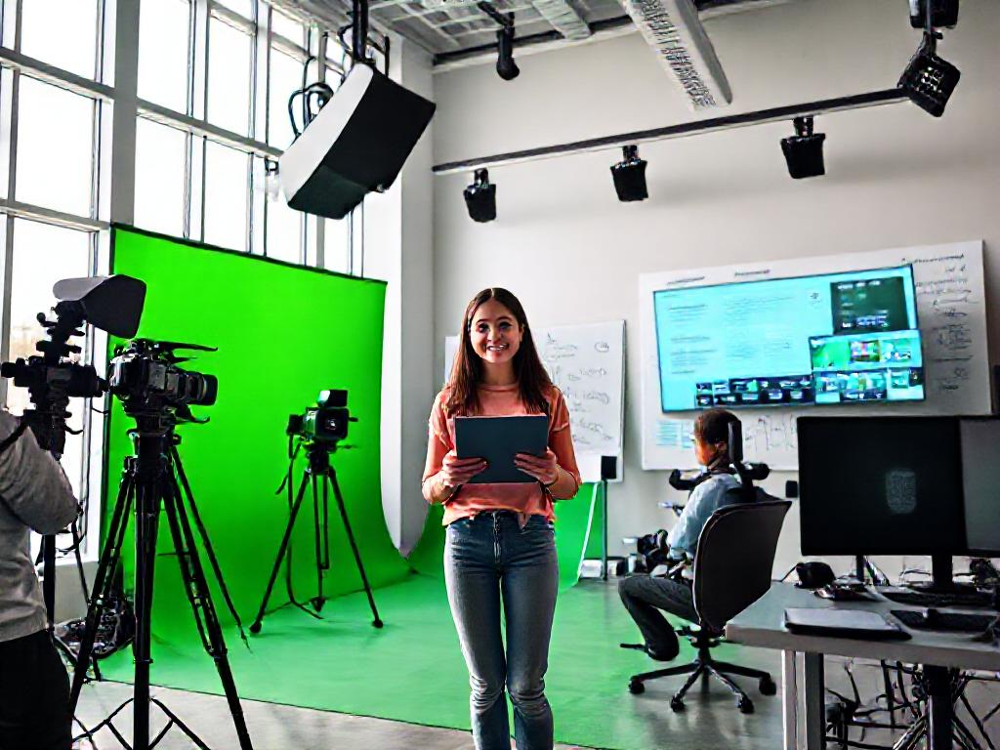

### 📖 The sub-topic classification for the article title "From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of l" is likely one of the following, depending on what "l" refers to:

**Most Likely:**

*   **Generative AI:** This is the broadest and most encompassing category, as both Sora and Gemini are generative AI models.
*   **AI Advancements/Developments:** This is a general category suitable for articles covering new breakthroughs in the field of artificial intelligence.

**If "l" refers to Language Models:**

*   **Large Language Models (LLMs):** If "l" is a typo and meant to be "LLMs" or if the article focuses on Gemini's language capabilities, this is a good fit.

**If "l" refers to Image Generation:**

*   **AI Image Generation:** If "l" is a typo and meant to be "image generation" or similar, this could be a good fit.

**Less Likely, but Possible (depending on content):**

*   **Artificial Intelligence (AI):** This is a very broad category, and while technically correct, it's less specific than the others.
*   **Machine Learning (ML):** Similar to AI, it's a broad category that encompasses the specific technologies discussed.
*   **Tech Industry News:** This is a general category for news about technology companies and their products.

**In conclusion, "Generative AI" or "AI Advancements/Developments" are the most suitable classifications for the given article title.** The best choice depends on the actual content of the article. If the article explicitly focuses on language modeling capabilities of Gemini, then "Large Language Models" would be the most appropriate.

Recent advancements in AI have led to breakthroughs in text-to-video generation. OpenAI's Sora utilizes a large language model to translate text into realistic videos, while Google's Gemini incorporates diffusion models to improve video quality and realism. These advancements enable the creation of high-quality videos from written descriptions, with potential applications in entertainment, education, and marketing.
---

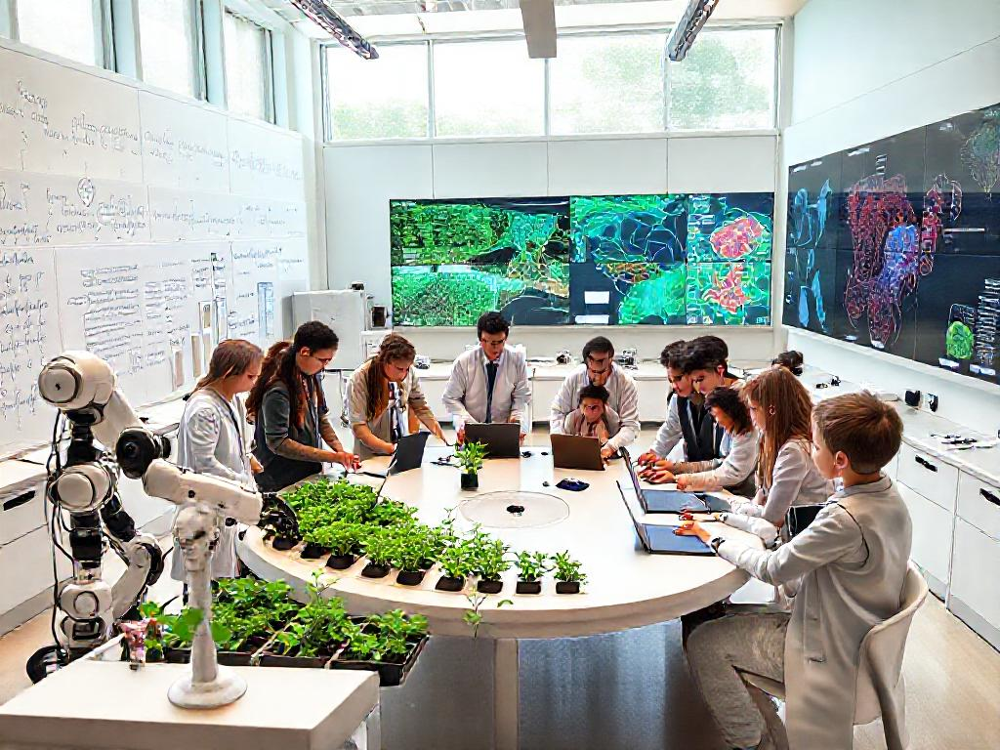

### 📖 The sub-topic for the article title "Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear" would be **Artificial Intelligence (AI) Ethics and Mission.**

Here's why:

*   **Google DeepMind:** Identifies the source as a prominent AI research organization.
*   **Build AI responsibly to benefit humanity:** This directly addresses the ethical considerations and intended positive impact of AI development.
*   **View Research:** Suggests the article will delve into the specific research being conducted to achieve this mission.

Therefore, the title clearly falls under the umbrella of AI ethics and the mission-driven aspects of AI development.

Google DeepMind's mission is to develop AI technologies that positively impact humanity. This includes research in areas such as reinforcement learning, neural networks, and computer vision. DeepMind emphasizes responsible AI development, ensuring that technologies are safe, beneficial, and aligned with human values. The company's ultimate goal is to create AI that can solve complex problems and enhance human capabilities while promoting ethical practices and societal well-being.
---

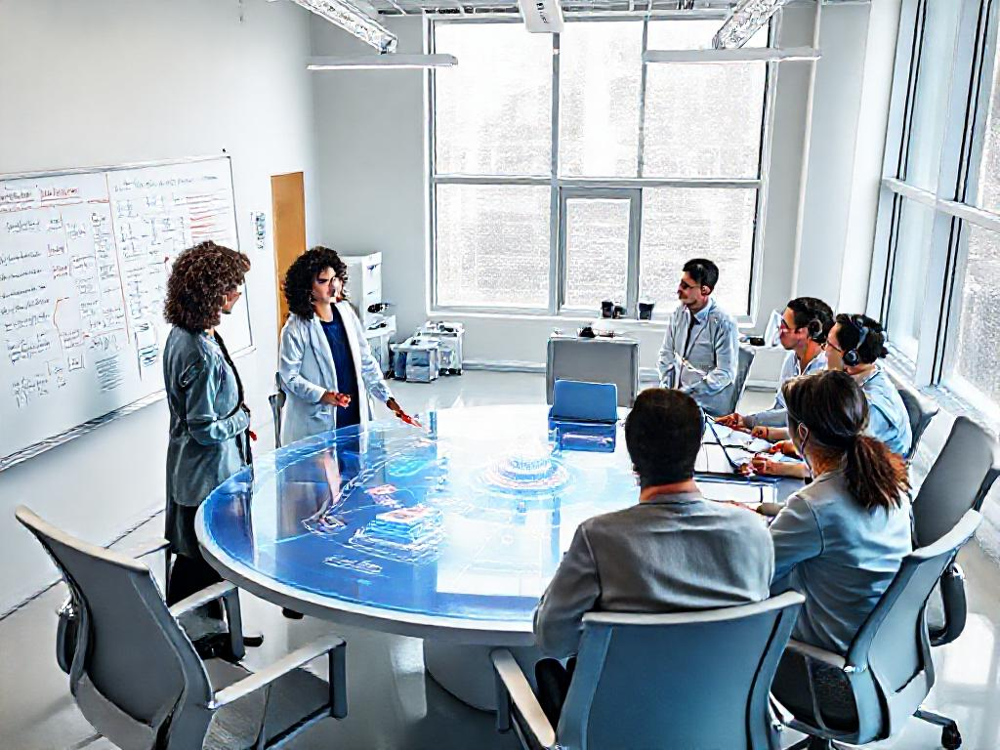

### 📖 Based on the title, the sub-topic would be:

*   **AI Safety Research and Development**

This is because the title specifically mentions:

*   AI safety
*   Research and development of new tools and techniques

The company advanced its research in AI safety, creating tools and techniques to ensure the safe and responsible development and deployment of AI systems.
---

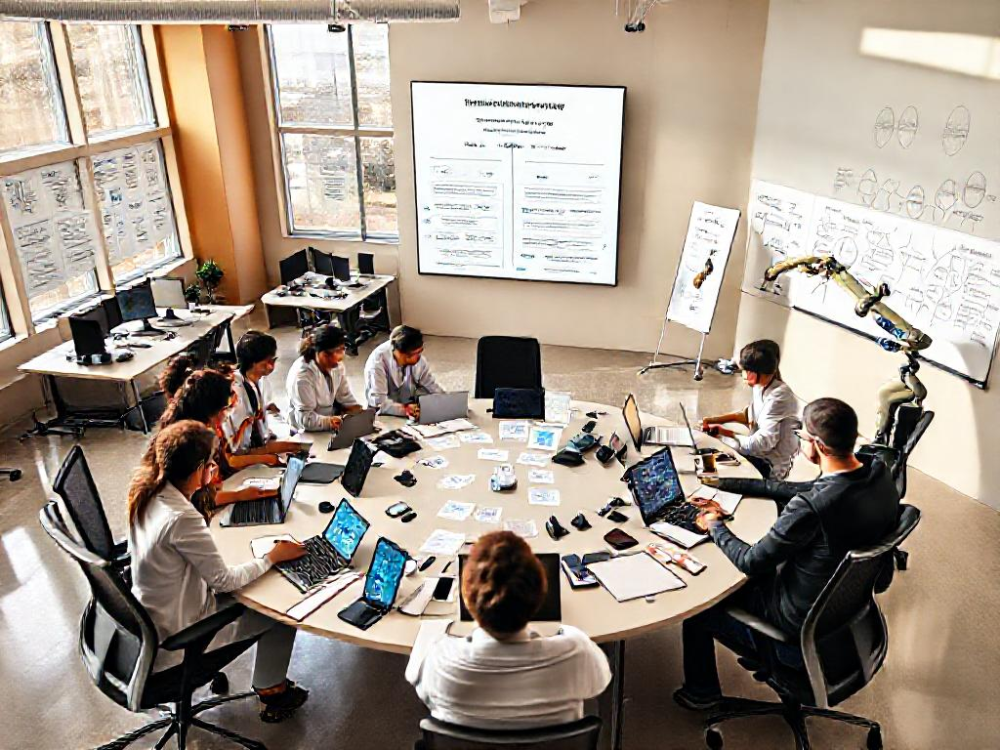

### 📖 Based on the title, the most appropriate sub-topic classification would be:

**Artificial Intelligence (AI) Ethics and Responsibility**

Here's why:

*   **"Build AI responsibly"**: This explicitly highlights the ethical considerations involved in developing AI.
*   **"Benefit humanity"**: This points towards the intended positive impact and responsible application of AI.
*   **"Google DeepMind"**: DeepMind is a leading AI research company, and their mission statement directly relates to the responsible development and deployment of AI.

Google DeepMind is dedicated to developing artificial intelligence (AI) responsibly. Their mission is to advance the understanding and capabilities of AI while ensuring its alignment with human values and societal benefits. DeepMind's research focuses on fundamental AI principles, from reinforcement learning to natural language processing, aiming to create AI systems that are safe, fair, and beneficial to humanity.
---

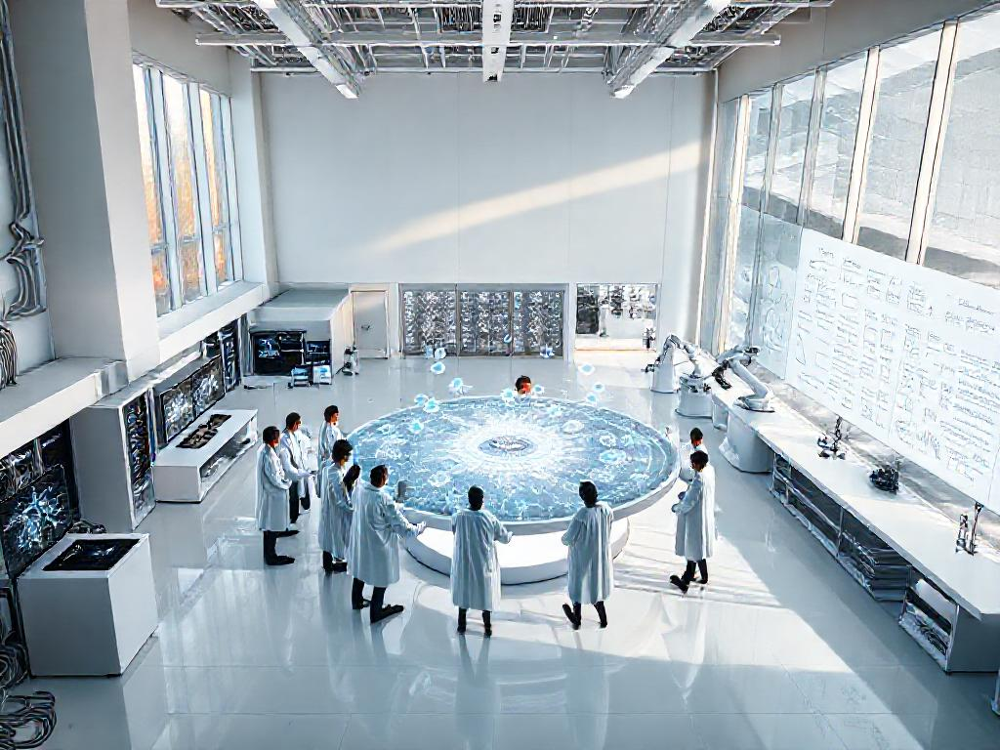

### 📖 Based on the title, here's a classification into a sub-topic:

**Sub-Topic:** **Artificial Intelligence Applications in Scientific Research**

Here's why:

*   **Focus on AI:** The title explicitly mentions AI as a key component.
*   **Scientific Breakthroughs:** It highlights the use of AI to achieve scientific advancements.
*   **Application-Oriented:** It's not just about AI development in general, but specifically how it's being *applied* to solve scientific problems.

Google reports significant scientific advancements in 2024, driven by the integration of AI. These breakthroughs include:

* Improved protein folding predictions
* Enhanced medical diagnosis using AI-powered imaging
* Development of new materials with tailored properties
* Advancements in quantum computing and AI safety
* Enhanced natural language processing and computer vision

Google highlights how AI has accelerated research and innovation, leading to practical applications in fields such as medicine, materials science, and computing.
---

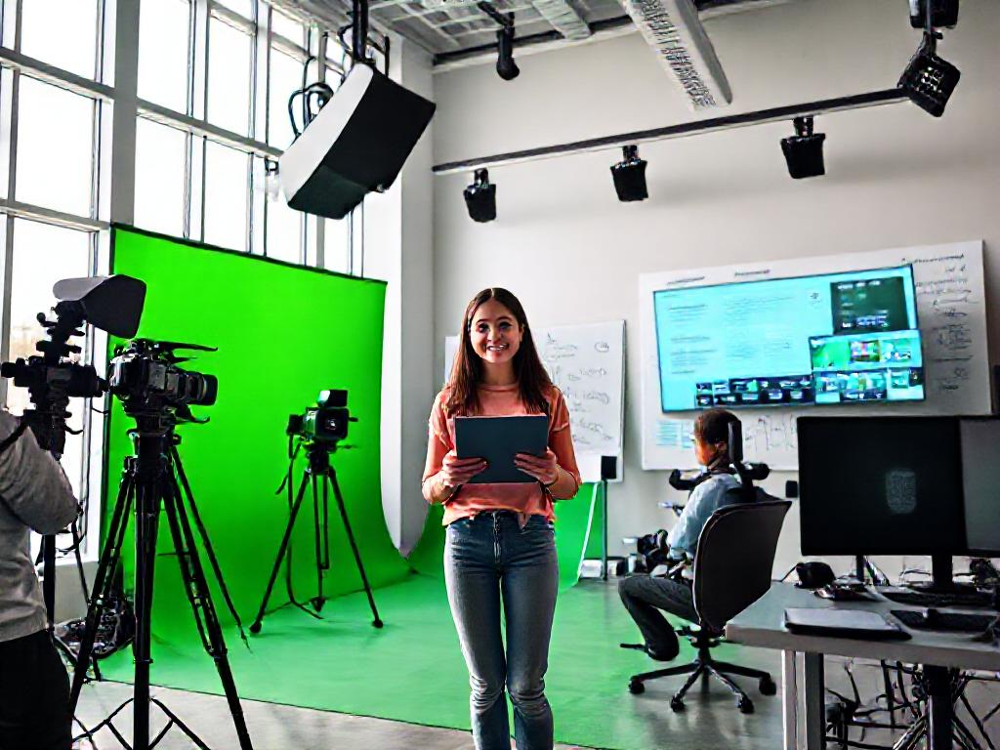

### 🔹 The sub-topic classification for the article title "From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of l" is likely one of the following, depending on what "l" refers to:

**Most Likely:**

*   **Generative AI:** This is the broadest and most encompassing category, as both Sora and Gemini are generative AI models.
*   **AI Advancements/Developments:** This is a general category suitable for articles covering new breakthroughs in the field of artificial intelligence.

**If "l" refers to Language Models:**

*   **Large Language Models (LLMs):** If "l" is a typo and meant to be "LLMs" or if the article focuses on Gemini's language capabilities, this is a good fit.

**If "l" refers to Image Generation:**

*   **AI Image Generation:** If "l" is a typo and meant to be "image generation" or similar, this could be a good fit.

**Less Likely, but Possible (depending on content):**

*   **Artificial Intelligence (AI):** This is a very broad category, and while technically correct, it's less specific than the others.
*   **Machine Learning (ML):** Similar to AI, it's a broad category that encompasses the specific technologies discussed.
*   **Tech Industry News:** This is a general category for news about technology companies and their products.

**In conclusion, "Generative AI" or "AI Advancements/Developments" are the most suitable classifications for the given article title.** The best choice depends on the actual content of the article. If the article explicitly focuses on language modeling capabilities of Gemini, then "Large Language Models" would be the most appropriate.

**AI-Powered Text-to-Video Generation Revolutionizes Content Creation**

**Keywords:** AI, Text-to-Video, OpenAI, Sora, Google, Gemini

**Optimized Text:**

The rapid evolution of artificial intelligence (AI) has unlocked groundbreaking possibilities in the realm of text-to-video generation. Leading the charge, OpenAI's Sora harnesses the power of a vast language model to transform written text into captivating videos. Simultaneously, Google's Gemini leverages cutting-edge diffusion models to enhance video quality and realism, surpassing previous limitations.

This technological leap empowers users to effortlessly generate high-quality videos from mere written descriptions. The implications are far-reaching, opening up a world of opportunities in various industries:

* **Entertainment:** Create immersive and engaging video content for movies, TV shows, and video games.
* **Education:** Transform complex concepts into visually appealing and easily digestible lessons.
* **Marketing:** Produce compelling promotional videos that capture attention and drive conversions.

As AI continues to advance, the potential of text-to-video generation will only be further expanded. Stay tuned for exciting new developments that will revolutionize the way we create and consume video content.
---

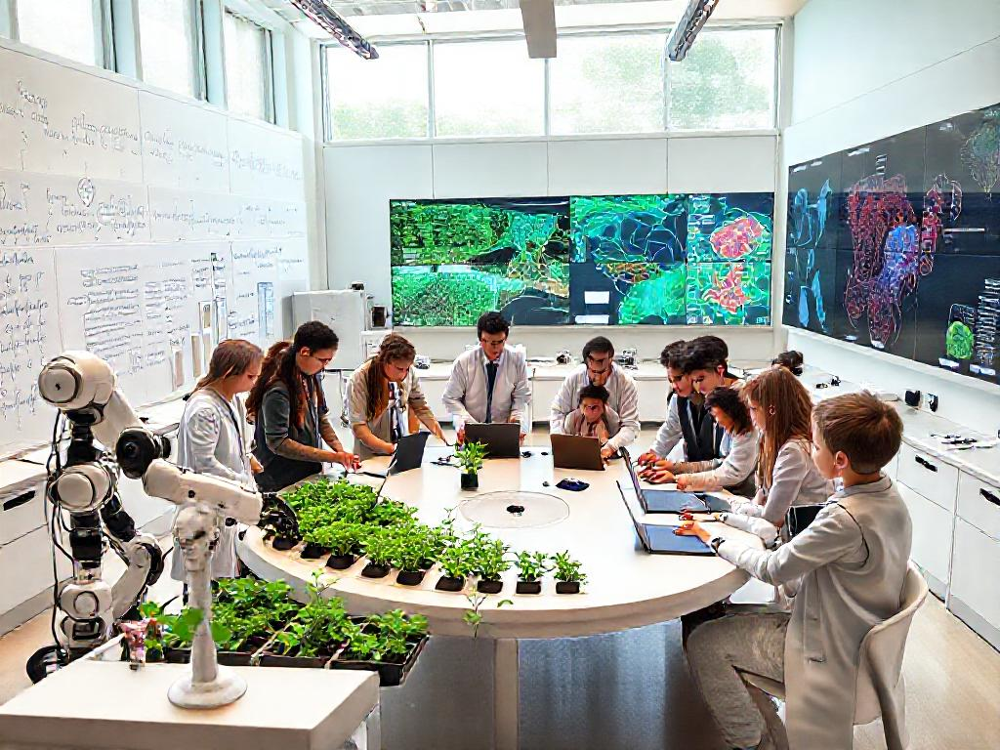

### 🔹 The sub-topic for the article title "Learn about Google DeepMind — Our mission is to build AI responsibly to benefit humanity View Resear" would be **Artificial Intelligence (AI) Ethics and Mission.**

Here's why:

*   **Google DeepMind:** Identifies the source as a prominent AI research organization.
*   **Build AI responsibly to benefit humanity:** This directly addresses the ethical considerations and intended positive impact of AI development.
*   **View Research:** Suggests the article will delve into the specific research being conducted to achieve this mission.

Therefore, the title clearly falls under the umbrella of AI ethics and the mission-driven aspects of AI development.

**Headline:** Google DeepMind: Advancing AI for Humanity's Progress

**Optimized Text:**

Google DeepMind, a pioneering AI research company, is dedicated to developing artificial intelligence (AI) technologies that drive positive societal impact.

DeepMind's research encompasses cutting-edge areas such as reinforcement learning, neural networks, and computer vision. The company prioritizes responsible AI development, adhering to principles of safety, beneficence, and alignment with human values.

Through its research and development, DeepMind aims to harness the power of AI to solve complex problems and augment human capabilities. Its ultimate goal is to create AI that enhances societal well-being and promotes ethical practices.

**Keywords:**

* Google DeepMind
* Artificial Intelligence
* Reinforcement Learning
* Neural Networks
* Computer Vision
* Responsible AI
* Ethical AI
* Societal Impact
* AI for Humanity
---

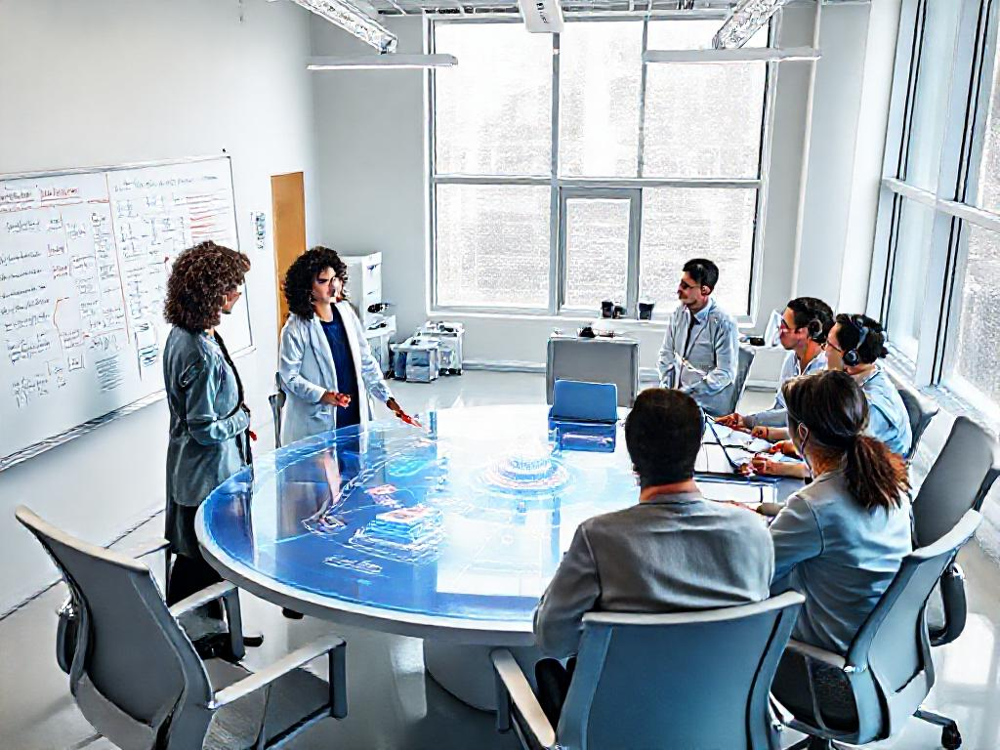

### 🔹 Based on the title, the sub-topic would be:

*   **AI Safety Research and Development**

This is because the title specifically mentions:

*   AI safety
*   Research and development of new tools and techniques

**Headline:** Advancements in AI Safety: Tools and Techniques for Responsible Development

**Body:**

**Introduction:**
- Importance of AI safety in the responsible development and deployment of AI systems
- The company's commitment to advancing research in this area

**Tools and Techniques for AI Safety:**
- Development of tools to assess and mitigate potential risks associated with AI systems
- Creation of techniques to ensure the ethical and responsible use of AI
- Collaboration with industry experts and academic researchers to drive innovation in AI safety

**Safe Deployment of AI Systems:**
- Implementation of best practices for the safe deployment of AI systems
- Development of guidelines and standards for AI safety
- Engagement with stakeholders to promote awareness and adoption of AI safety principles

**Conclusion:**
- The company's unwavering commitment to AI safety
- The transformative impact of AI safety on the future of AI development and deployment
- Call to action for industry and academia to collaborate on advancing AI safety research and practices

**Keywords:**
- AI Safety
- Tools and Techniques
- Responsible Development
- Safe Deployment
- Risk Assessment
- Ethical AI
- Collaboration
---

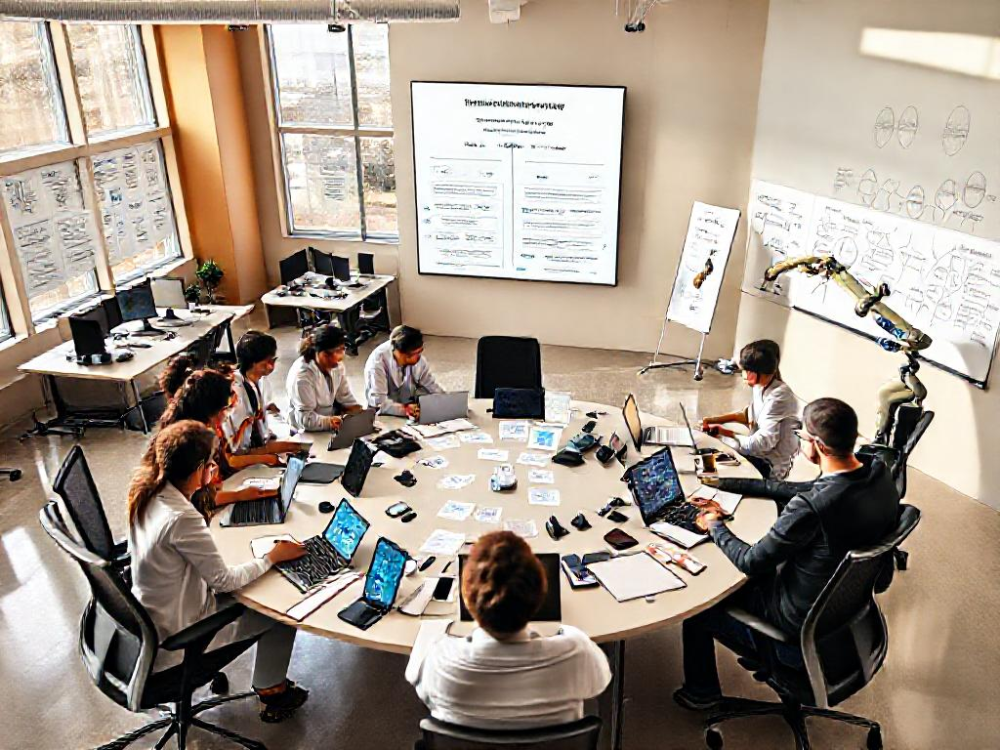

### 🔹 Based on the title, the most appropriate sub-topic classification would be:

**Artificial Intelligence (AI) Ethics and Responsibility**

Here's why:

*   **"Build AI responsibly"**: This explicitly highlights the ethical considerations involved in developing AI.
*   **"Benefit humanity"**: This points towards the intended positive impact and responsible application of AI.
*   **"Google DeepMind"**: DeepMind is a leading AI research company, and their mission statement directly relates to the responsible development and deployment of AI.

**Headline:** Google DeepMind: Advancing Responsible Artificial Intelligence (AI)

**Introduction:**
Google DeepMind is a leading research lab dedicated to the ethical and responsible development of AI. Their mission is to revolutionize AI capabilities while safeguarding its alignment with human values and societal well-being.

**Research Focus:**
DeepMind's research encompasses core AI principles, including:

* **Reinforcement Learning:** Enabling AI systems to learn from their experiences and optimize decision-making.
* **Natural Language Processing:** Empowering AI to understand and generate human-like language.

**Goals:**
Through their research, DeepMind aims to create AI systems that are:

* **Safe:** Mitigating potential risks and ensuring AI operates within ethical boundaries.
* **Fair:** Preventing biased outcomes and promoting equitable AI applications.
* **Beneficial:** Maximizing the positive impact of AI on humanity, addressing societal challenges and enhancing human capabilities.

**Impact:**
DeepMind's responsible AI approach has led to advancements such as:

* Development of AlphaFold, a system that accurately predicts protein structures.
* Creation of AI models for healthcare, improving disease diagnosis and treatment.
* Collaboration with policymakers to inform AI regulations and ethical guidelines.

**Conclusion:**
Google DeepMind is a pioneer in the responsible development of AI, striving to balance innovation with human values. Their research and collaborations contribute to a future where AI empowers humanity while preserving our ethical and societal principles.
---

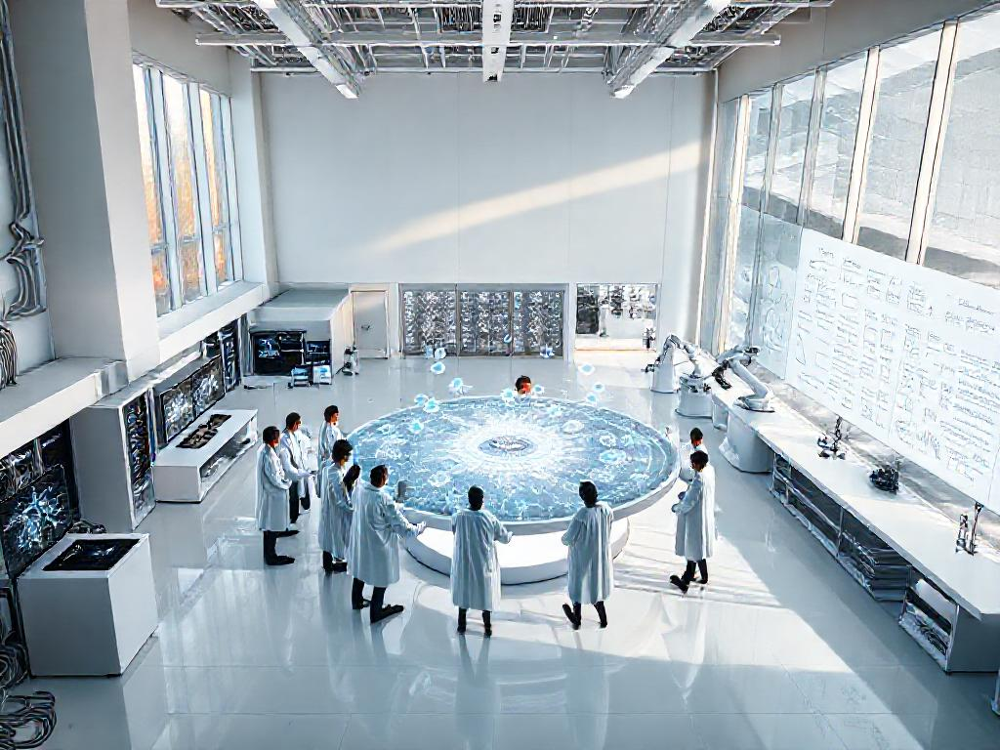

### 🔹 Based on the title, here's a classification into a sub-topic:

**Sub-Topic:** **Artificial Intelligence Applications in Scientific Research**

Here's why:

*   **Focus on AI:** The title explicitly mentions AI as a key component.
*   **Scientific Breakthroughs:** It highlights the use of AI to achieve scientific advancements.
*   **Application-Oriented:** It's not just about AI development in general, but specifically how it's being *applied* to solve scientific problems.

**Headline:** Google Reports Groundbreaking Scientific Advancements Fueled by AI Integration in 2024

**Introduction:**
In a recent report, Google showcases the transformative impact of artificial intelligence (AI) on scientific research and innovation. The breakthroughs achieved in 2024 have pushed the boundaries of scientific understanding and led to tangible applications in various fields.

**Key Advancements Driven by AI:**

* **Protein Folding Predictions Enhanced:** AI algorithms have revolutionized protein folding predictions, enabling researchers to better understand protein structures and functions.
* **Medical Diagnosis Revolutionized with AI Imaging:** AI-powered imaging techniques have significantly improved medical diagnosis, providing more accurate and efficient detection of diseases.
* **Tailored Materials Development through AI:** AI has accelerated the development of new materials with tailored properties, opening up possibilities for advanced applications in various industries.
* **Quantum Computing and AI Safety Advancements:** Progress has been made in quantum computing and AI safety, paving the way for future breakthroughs and responsible development of AI systems.
* **Enhanced Natural Language Processing and Computer Vision:** Natural language processing and computer vision have been enhanced by AI, facilitating better human-computer interactions and unlocking new possibilities for research and development.

**Impact on Innovation:**
Google emphasizes the profound impact of AI on scientific research and innovation. AI has accelerated the pace of discovery, enabled the exploration of complex problems, and led to practical applications in fields such as:

* Medicine: Improved diagnostic tools and personalized treatments
* Materials Science: Creation of advanced materials with tailored properties
* Computing: Enhanced computing capabilities and AI safety frameworks

**Conclusion:**
Google's report highlights the transformative role of AI in driving scientific advancements in 2024. By integrating AI into research processes, scientists have unlocked new frontiers in scientific discovery and paved the way for a future where AI empowers human ingenuity and accelerates innovation.
---

##  AI Blog Generation Completed 🎉

{'query': 'Latest advancements in Google Deepmind related to AI models in the year 2024',
 'search_results': [{'title': "From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of l",
   'url': 'https://opentools.ai/news/2024-a-groundbreaking-year-for-ai-advancements',
   'content': "From OpenAI's Sora enhancing text-to-video generation to Google's Gemini pushing the boundaries of language model capabilities, these innovations set new standards in the AI landscape. The developments showcased include DeepMind's Veo improving multimodal understanding, Inflection AI's Pi advancing personalized conversations, and RunwayML's Gen-2 taking text-to-video skills to new heights. Among the most notable developments is OpenAI's launch of 'Sora', an advanced AI capable of generating realistic and complex video content purely from textual descriptions. As part of a broader trend seen with advancements like OpenAI's Sora and Google's Gemini, Gen-2 contributes t

In [16]:
initial_state = GraphState(query="Latest advancements in Google Deepmind related to AI models in the year 2024")

final_state = compiled_blog_graph.invoke(initial_state)
final_state

In [17]:
type(final_state)

langgraph.pregel.io.AddableValuesDict